# PROJET PYTHON FINAL A3 

On import DataFrame et numpy

In [1]:
# storing and anaysis
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
import plotly.express as px
from urllib.request import urlopen
import json

warnings.filterwarnings('ignore')

Fonction qui crée les DataFrame des valeurs foncieres 2020 et 2019

In [2]:
data2020=pd.read_csv("./valeursfoncieres-2020.txt", sep="|",low_memory=False)
data2020.head()

,Code service CH,Reference document,1 Articles CGI,2 Articles CGI,3 Articles CGI,4 Articles CGI,5 Articles CGI,No disposition,Date mutation,Nature mutation,...,Surface Carrez du 5eme lot,Nombre de lots,Code type local,Type local,Identifiant local,Surface reelle bati,Nombre pieces principales,Nature culture,Nature culture speciale,Surface terrain
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,07/01/2020,Vente,...,NaN,0,NaN,NaN,NaN,NaN,NaN,T,NaN,1061.0
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,02/01/2020,Vente,...,NaN,0,NaN,NaN,NaN,NaN,NaN,BT,NaN,85.0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,02/01/2020,Vente,...,NaN,0,NaN,NaN,NaN,NaN,NaN,T,NaN,1115.0
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,02/01/2020,Vente,...,NaN,0,NaN,NaN,NaN,NaN,NaN,T,NaN,1940.0
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,02/01/2020,Vente,...,NaN,0,NaN,NaN,NaN,NaN,NaN,T,NaN,1148.0


On commence le netoyage des données

In [3]:
#netoyage colonnes
column_with_nan = data2020.columns[data2020.isna().any()]
for column in column_with_nan:
    if data2020[column].isna().sum()*100.0/data2020.shape[0] > 50:
        data2020.drop(column,1, inplace=True)
uselesscolum = ['Section','No plan','Nombre de lots','Code type local','Nature culture','No voie','No disposition']
data2020.drop(uselesscolum,axis=1, inplace=True)
data2020

,Date mutation,Nature mutation,Valeur fonciere,Type de voie,Code voie,Voie,Code postal,Commune,Code departement,Code commune,Type local,Surface reelle bati,Nombre pieces principales,Surface terrain
0,07/01/2020,Vente,"8000,00",NaN,B063,FORTUNAT,1250.0,CEYZERIAT,01,72,NaN,NaN,NaN,1061.0
1,02/01/2020,Vente,"2175,00",NaN,B124,TERRES DES CINQ SAULES,1290.0,LAIZ,01,203,NaN,NaN,NaN,85.0
2,02/01/2020,Vente,"2175,00",NaN,B006,BOIS DU CHAMP RION,1290.0,LAIZ,01,203,NaN,NaN,NaN,1115.0
3,02/01/2020,Vente,"2175,00",NaN,B025,EN COROBERT,1290.0,LAIZ,01,203,NaN,NaN,NaN,1940.0
4,02/01/2020,Vente,"2175,00",NaN,B124,TERRES DES CINQ SAULES,1290.0,LAIZ,01,203,NaN,NaN,NaN,1148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2459555,16/12/2020,Vente,"1937500,00",RUE,1748,CHANOINESSE,75004.0,PARIS 04,75,104,Appartement,87.0,4.0,447.0
2459556,16/12/2020,Vente,"1937500,00",RUE,1748,CHANOINESSE,75004.0,PARIS 04,75,104,Dépendance,0.0,0.0,447.0
2459557,16/12/2020,Vente,"1937500,00",RUE,1748,CHANOINESSE,75004.0,PARIS 04,75,104,Appartement,82.0,2.0,447.0
2459558,16/12/2020,Vente,"1937500,00",RUE,1748,CHANOINESSE,75004.0,PARIS 04,75,104,Dépendance,0.0,0.0,447.0


In [4]:
#netoyage lignes
data2020 = data2020.dropna(axis=0,thresh=14)

In [5]:
data2020["Valeur fonciere"] = data2020["Valeur fonciere"].str.replace(',','.')
data2020.head()

,Date mutation,Nature mutation,Valeur fonciere,Type de voie,Code voie,Voie,Code postal,Commune,Code departement,Code commune,Type local,Surface reelle bati,Nombre pieces principales,Surface terrain
13,06/01/2020,Vente,180300.00,RUE,0970,COMTE DE LA TEYSSONNIERE,1000.0,BOURG-EN-BRESSE,01,53,Maison,75.0,4.0,525.0
16,03/01/2020,Vente,350750.00,CHE,0149,DES GDES CADALLES,1000.0,SAINT-DENIS-LES-BOURG,01,344,Maison,201.0,7.0,1267.0
17,03/01/2020,Vente,350750.00,CHE,0149,DES GDES CADALLES,1000.0,SAINT-DENIS-LES-BOURG,01,344,Maison,201.0,7.0,1497.0
18,03/01/2020,Vente,350750.00,CHE,0149,DES GDES CADALLES,1000.0,SAINT-DENIS-LES-BOURG,01,344,Dépendance,0.0,0.0,1497.0
19,03/01/2020,Vente,350750.00,CHE,0149,DES GDES CADALLES,1000.0,SAINT-DENIS-LES-BOURG,01,344,Dépendance,0.0,0.0,1267.0


On convertie certaine colonnes en float

In [6]:
data2020["Valeur fonciere"] = pd.to_numeric(data2020["Valeur fonciere"])
data2020["Surface reelle bati"] = pd.to_numeric(data2020["Surface reelle bati"])
data2020["Code postal"] = data2020["Code postal"].astype({'Code postal': 'int32'})
data2020["Date mutation"] = pd.to_datetime(data2020["Date mutation"])

In [7]:
# On calcul le prix au metre carré de chaque commune
tempPrix2020 = data2020
tempPrix2020 = tempPrix2020[(tempPrix2020["Surface terrain"]>0)]
tempPrix2020["Prix m2"] = (tempPrix2020["Valeur fonciere"] / tempPrix2020["Surface terrain"])
tmp2020 = tempPrix2020.groupby(["Code departement"])["Valeur fonciere","Surface terrain","Prix m2"].mean()
tmp2020.style.background_gradient(cmap='Blues')

,Valeur fonciere,Surface terrain,Prix m2
Code departement,,,
01,307093.833445,848.306101,897.639361
02,150156.404416,639.503600,615.104388
03,147610.986020,939.764346,472.165424
04,228390.870685,814.994590,1064.209115
05,315760.679790,603.837270,1276.309895
06,4130406.388620,1314.774650,3997.515680
07,191603.127499,850.479269,664.235733
08,136935.526889,3076.729021,661.265744
09,188810.321271,559.195024,793.943139


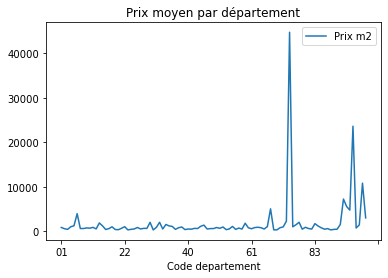

In [32]:
tmp2020['Code departement'] = tmp2020.index
tmp2020.plot(x='Code departement',y='Prix m2',title="Prix moyen par département")

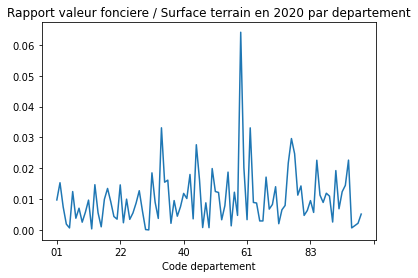

In [9]:
# Pourcentage de vente par region
DataFrameVenteMaison2020 = data2020[data2020['Nature mutation'] == "Vente"]
vente = DataFrameVenteMaison2020.groupby(["Code departement"])["Nature mutation"].count() / len(DataFrameVenteMaison2020)
vente.plot(title="Rapport valeur fonciere / Surface terrain en 2020 par departement")

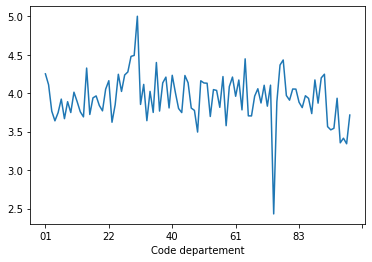

In [10]:
# Moyenne du nombre de piece par region
DataFrameNbPiece2020 = data2020[data2020['Nombre pieces principales'] != 0]
resPiece = DataFrameNbPiece2020.groupby(["Code departement"])["Nombre pieces principales"].mean()# / len(DataFramenbPiece2020)
resPiece.plot()

pandas.core.frame.DataFrame

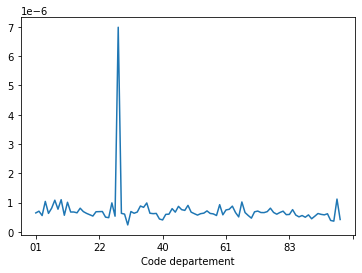

In [11]:
# On calcul le ratio terrain total par rapport a celui de la maison
dataSuperficie = data2020
dataSuperficie = dataSuperficie[(dataSuperficie["Surface terrain"]>0)]
dataSuperficie = dataSuperficie[(dataSuperficie["Surface reelle bati"]>0)]
dataSuperficie["ratioTerrainMaison"] = (tempPrix2020["Surface reelle bati"] / tempPrix2020["Surface terrain"])
tmpBis2020 = dataSuperficie.groupby(["Code departement"])["ratioTerrainMaison"].mean() / len(dataSuperficie)
#tmp.style.background_gradient(cmap='Blues')
tmpBis2020.plot()
type(tmp2020)

Nombre de vente dans un département

In [14]:
def VenteParDep(data,codeDep):
    tmpData = [data['Date mutation'],data['Nature mutation'],data['Code departement']]
    tmpHeaders = ['Date mutation','Nature mutation','Code departement']
    tmp = pd.concat(tmpData,axis=1,keys=tmpHeaders)
    tmp_countvente_2019 = tmp.reset_index(drop=True)
    tmp_countvente_2019 = tmp[tmp['Nature mutation'] == 'Vente']
    tmp_countvente_2019 = tmp[tmp['Code departement'] == codeDep]
    dataClean = tmp_countvente_2019.groupby(by="Date mutation",sort=True).count()
    dataClean = dataClean.drop(labels='Code departement',axis=1)
    dataClean.columns = ['Nombre de vente']
    dataClean["Date"] = dataClean.index
    #dataClean['Date'] = pd.to_datetime(dataClean["Date"])
    return dataClean
#dataVente2019 = VenteParDep(data2019,'75')
dataVente2020 = VenteParDep(data2020, '75')

In [15]:
fig = px.bar(dataVente2020, x = 'Date',y = 'Nombre de vente')
fig.show()

In [16]:
import requests
# Read the geojson data with Italy's regional borders [enter image description here][2]from github
repo_url = 'https://france-geojson.gregoiredavid.fr/repo/departements.geojson'
france_regions_geo = requests.get(repo_url).json()
regions = data2020.loc[:,"Code departement"].unique()

In [17]:
# Create a dataframe with the region names
df = pd.DataFrame(regions, columns=['code'])
# For demonstration, create a column with the length of the region's name
df['index'] = df['code']
df = df.set_index('index')
df['Prix'] = tmp2020["Prix m2"]

In [18]:
# Choropleth representing the length of region names
fig = px.choropleth(data_frame=df, 
                    geojson=france_regions_geo, 
                    locations='code', # name of dataframe column
                    featureidkey='properties.code',  # path to field in GeoJSON feature object with which to match the values passed in to locations
                    color='Prix',
                    range_color=[1,7000],
                    color_continuous_scale="greens",
                    scope="europe",
                   )
fig.update_geos(showcountries=False, showcoastlines=False, showland=False, fitbounds="locations")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

### Nombre de ventes par département

In [19]:
tmpData = [data2020['Nature mutation'],data2020['Code departement']]
tmpHeaders = ['Nature mutation','Code departement']
tmp = pd.concat(tmpData,axis=1,keys=tmpHeaders)
tmp_countvente_2019 = tmp.reset_index(drop=True)
tmp_countvente_2019 = tmp[tmp['Nature mutation'] == 'Vente']
dataClean = tmp_countvente_2019.groupby(by="Code departement",sort=True).count()
dataClean.columns = ['Nombre de vente']
dataClean["Code"] = dataClean.index

# Create a dataframe with the region names
df_NbVente = pd.DataFrame(regions, columns=['code'])
# For demonstration, create a column with the length of the region's name
df_NbVente['index'] = df_NbVente['code']
df_NbVente = df_NbVente.set_index('index')
df_NbVente['Ventes'] = dataClean["Nombre de vente"]

In [20]:
# Choropleth representing the length of region names
fig = px.choropleth(data_frame=df_NbVente, 
                    geojson=france_regions_geo, 
                    locations='code', # name of dataframe column
                    featureidkey='properties.code',  # path to field in GeoJSON feature object with which to match the values passed in to locations
                    color='Ventes',
                    color_continuous_scale="aggrnyl",
                    scope="europe",
                   )
fig.update_geos(showcountries=False, showcoastlines=False, showland=False, fitbounds="locations")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

### Nombre de piece par departement


In [21]:
# Create a dataframe with the region names
df_NbPiece = pd.DataFrame(regions, columns=['code'])
# For demonstration, create a column with the length of the region's name
df_NbPiece['index'] = df_NbPiece['code']
df_NbPiece = df_NbPiece.set_index('index')
df_NbPiece['Piece'] = resPiece.values
#resPiece

In [22]:
# Choropleth representing the length of region names
fig = px.choropleth(data_frame=df_NbPiece, 
                    geojson=france_regions_geo, 
                    locations='code', # name of dataframe column
                    featureidkey='properties.code',  # path to field in GeoJSON feature object with which to match the values passed in to locations
                    color='Piece',
                    color_continuous_scale="aggrnyl",
                    scope="europe",
                   )
fig.update_geos(showcountries=False, showcoastlines=False, showland=False, fitbounds="locations")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

### Département VS

In [137]:
# Du 1er Janvier au 1er Mars
temp = data2020.groupby(["Code departement","Date mutation"])["Valeur fonciere","Surface reelle bati"].mean()
temp = temp.reset_index()
temp = temp.sort_values('Valeur fonciere',ascending=True).head(len(temp)//2)
temp = temp[temp['Date mutation'] >= pd.Timestamp(2020,1,1)]
temp = temp[temp['Date mutation'] < pd.Timestamp(2020,3,1)]

fig = px.bar(temp,x="Date mutation",y="Valeur fonciere",color="Code departement",orientation='v', height=600,title="Valeur fonciere moyenne",color_discrete_sequence = px.colors.cyclical.mygbm)
fig.show()

In [138]:
fig = px.bar(temp,x="Date mutation",y="Surface reelle bati",color="Code departement",orientation='v', height=600,title="Surface reelle bati moyenne",color_discrete_sequence = px.colors.cyclical.mygbm)
fig.show()

In [139]:
temp = data2020.groupby(["Code departement","Type local"])["Valeur fonciere","Surface reelle bati"].mean()
temp = temp.reset_index()
temp = temp.sort_values('Valeur fonciere',ascending=True).head(len(temp)//2)

fig = px.bar(temp,x="Type local",y="Valeur fonciere",color="Code departement",orientation='v', height=600,title="Valeur fonciere moyenne",color_discrete_sequence = px.colors.cyclical.mygbm)
fig.show()

In [140]:
fig = px.bar(temp,x="Type local",y="Surface reelle bati",color="Code departement",orientation='v', height=600,title="Surface reelle bati moyenne",color_discrete_sequence = px.colors.cyclical.mygbm)
fig.show()

## Paris et banlieue vs 

In [160]:
def is_Pris(row):
    if row["Code departement"]=='92' or row["Code departement"]=='93' or row["Code departement"]=='94' or row["Code departement"]=='91' or row["Code departement"]=='75':
        return "From Paris"
    else:
        return "Outside Paris"

tempVS = data2020.copy()
tempVS['Code departement'] = tempVS.apply(is_Pris, axis = 1)

In [161]:
tempVS = tempVS.groupby(["Code departement","Date mutation"])["Valeur fonciere","Surface reelle bati"]
tempVS=tempVS.mean().reset_index()
mask = tempVS['Code departement'] != tempVS['Code departement'].shift(1)
tempVS.loc[mask, 'Valeur fonciere'] = np.nan
tempVS.loc[mask, 'Surface reelle bati'] = np.nan

fig = px.bar(tempVS, x='Date mutation', y='Valeur fonciere', color='Code departement', barmode='group', 
             text='Valeur fonciere', title='Valeur fonciere', color_discrete_sequence= ["#393e46", "#ff2e63", '#21bf73'])
fig.update_traces(textposition='outside')
fig.show()

fig = px.bar(tempVS, x='Date mutation', y='Surface reelle bati', color='Code departement', barmode='group', 
             text='Surface reelle bati', title='Surface reelle bati', color_discrete_sequence= ["#393e46", "#ff2e63", '#21bf73'])
fig.update_traces(textposition='outside')
fig.update_traces(textangle=-90)
fig.show()

#### Vente en fonction du temps et de Paris vs autre

In [171]:
def is_Paris(row):
    if row["Code departement"]=='92' or row["Code departement"]=='93' or row["Code departement"]=='94' or row["Code departement"]=='91' or row["Code departement"]=='75':
        if row["Code departement"]=='75':
            return "Banlieue"
        else:
            return "Paris"
    else:
        return "Autre"

tempVS = data2020.copy()
tempVS['Code departement'] = tempVS.apply(is_Paris, axis = 1)
tempVS['Date mutation'] = tempVS["Date mutation"].dt.strftime('%Y-%m-%d')
tempVS= tempVS.groupby(['Code departement', 'Date mutation'])["Valeur fonciere","Surface reelle bati"].mean().reset_index()
tempVS = tempVS.melt(id_vars=['Code departement', 'Date mutation'], value_vars=['Valeur fonciere', 'Surface reelle bati'], 
                 var_name='Case', value_name='Count').sort_values('Count')
tempVS.head()

fig = px.bar(tempVS, y='Code departement', x='Count', color='Code departement', barmode='group', orientation='h',
             text='Count', title='Paris - France - Valeur fonciere', animation_frame='Date mutation',
             color_discrete_sequence= ['#ff2e63', '#21bf73', '#393e46'])
fig.update_traces(textposition='outside')
# fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
# fig.update_layout(yaxis={'categoryorder':'array', 
#                          'categoryarray':['Hubei','Other Chinese Provinces','Rest of the World']})
fig.show()

### Pourcentage de vente maison par departement

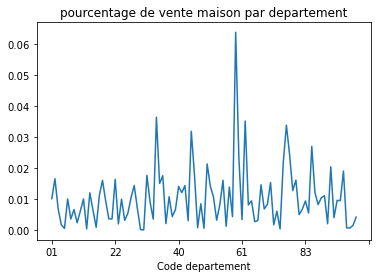

In [23]:
DataFrameVenteMaison2020 = data2020[data2020['Type local'] == "Maison"]
vente = DataFrameVenteMaison2020.groupby(["Code departement"])["Type local"].count() / len(DataFrameVenteMaison2020)
vente.plot(title="pourcentage de vente maison par departement")

# Pourcentage de vente maison par departement

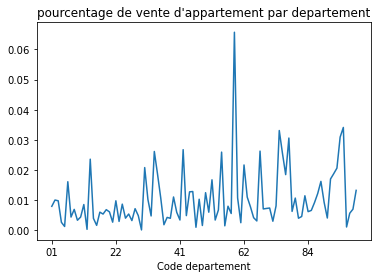

In [24]:
DataFrameVenteAppart2020 = data2020[data2020['Type local'] == "Appartement"]
vente = DataFrameVenteAppart2020.groupby(["Code departement"])["Type local"].count() / len(DataFrameVenteAppart2020)
vente.plot(title="pourcentage de vente d'appartement par departement")

# Pourcentage de vente maison par departement

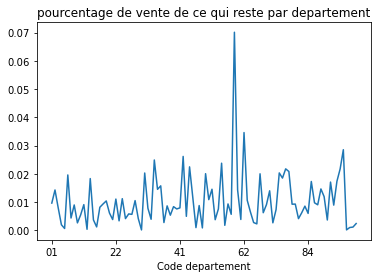

In [25]:
DataFrameVenteAutre2020 = data2020[data2020['Type local'] != "Appartement"]
DataFrameVenteAutre2020 = DataFrameVenteAutre2020[DataFrameVenteAutre2020['Type local'] != "Maison"]
vente = DataFrameVenteAutre2020.groupby(["Code departement"])["Type local"].count() / len(DataFrameVenteAutre2020)
vente.plot(title="pourcentage de vente de ce qui reste par departement")

### Nb maison dont la valeur fonciere valent moin de 10000e

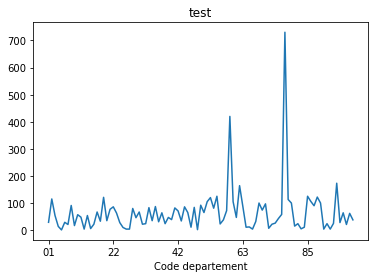

In [26]:
DataFrameVenteAppart2020 = data2020[data2020['Valeur fonciere'] < 10000]
venteValFonciere = DataFrameVenteAppart2020.groupby(["Code departement"])["Code departement"].count()
venteValFonciere.plot(title="test")

### Nb maison dont la valeur fonciere valent plus de 1000000

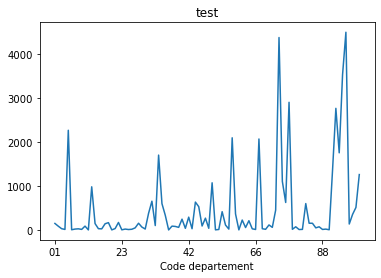

In [27]:
DataFrameVenteAppart2020 = data2020[data2020['Valeur fonciere'] > 1000000]
venteValFonciere = DataFrameVenteAppart2020.groupby(["Code departement"])["Code departement"].count()
venteValFonciere.plot(title="test")

### 5 maisons les moins cher de france

In [28]:
copydata = data2020.sort_values(by=['Valeur fonciere'])
copydata.head()

,Date mutation,Nature mutation,Valeur fonciere,Type de voie,Code voie,Voie,Code postal,Commune,Code departement,Code commune,Type local,Surface reelle bati,Nombre pieces principales,Surface terrain
2011891,2020-10-14,Vente,0.15,RUE,1743,ROMUALD GUILLEMET,84200,CARPENTRAS,84,31,Local industriel. commercial ou assimilé,4472.0,0.0,3223.0
1004995,2020-10-04,Vente,0.15,RTE,2640,DE VANNES,44800,ST-HERBLAIN,44,162,Local industriel. commercial ou assimilé,1772.0,0.0,23686.0
1004994,2020-10-04,Vente,0.15,RTE,2640,DE VANNES,44800,ST-HERBLAIN,44,162,Local industriel. commercial ou assimilé,10212.0,0.0,23686.0
401282,2020-11-24,Vente,0.15,RUE,1940,DU GENERAL LECLERC,22000,SAINT-BRIEUC,22,278,Local industriel. commercial ou assimilé,80.0,0.0,69.0
1741086,2020-07-28,Vente,0.15,RTE,0760,DES PRES ROLLIER,74330,SILLINGY,74,272,Local industriel. commercial ou assimilé,9980.0,0.0,17308.0


### Liste departement ou il y'a des valeurs fonciere à 250 millions d'euro

In [29]:
DataFrameVenteAppart2020 = data2020[data2020['Valeur fonciere'] > 250000000]
DataFrameVenteAppart2020 = DataFrameVenteAppart2020['Code postal'].unique()
DataFrameVenteAppart2020

array([91800, 94120, 75008, 75009, 75013])

### Liste des maison ou il y'a des valeurs fonciere à 5 millions d'euro

In [30]:
DataFrameVenteAppart2020 = data2020[data2020['Valeur fonciere'] > 250000000]
DataFrameVenteAppart2020
#On voit donc qu'il y'a des erreurs de saisie dans le dataset

,Date mutation,Nature mutation,Valeur fonciere,Type de voie,Code voie,Voie,Code postal,Commune,Code departement,Code commune,Type local,Surface reelle bati,Nombre pieces principales,Surface terrain
2187634,2020-10-14,Vente,435244992.0,RUE,0630,DU CHEMIN VERT,91800,BRUNOY,91,114,Maison,122.0,5.0,803.0
2335029,2020-09-04,Vente,267336240.0,AV,6152,MAL DE LATTRE DE TASSIGNY,94120,FONTENAY-SOUS-BOIS,94,33,Local industriel. commercial ou assimilé,2021.0,0.0,3187.0
2335030,2020-09-04,Vente,267336240.0,AV,6152,MAL DE LATTRE DE TASSIGNY,94120,FONTENAY-SOUS-BOIS,94,33,Local industriel. commercial ou assimilé,285.0,0.0,3187.0
2335031,2020-09-04,Vente,267336240.0,AV,6152,MAL DE LATTRE DE TASSIGNY,94120,FONTENAY-SOUS-BOIS,94,33,Local industriel. commercial ou assimilé,315.0,0.0,3187.0
2335033,2020-09-04,Vente,267336240.0,RUE,1413,CARNOT,94120,FONTENAY-SOUS-BOIS,94,33,Local industriel. commercial ou assimilé,655.0,0.0,2109.0
2335034,2020-09-04,Vente,267336240.0,RUE,1413,CARNOT,94120,FONTENAY-SOUS-BOIS,94,33,Local industriel. commercial ou assimilé,201.0,0.0,2109.0
2335035,2020-09-04,Vente,267336240.0,RUE,1413,CARNOT,94120,FONTENAY-SOUS-BOIS,94,33,Local industriel. commercial ou assimilé,801.0,0.0,2109.0
2335037,2020-09-04,Vente,267336240.0,RUE,1413,CARNOT,94120,FONTENAY-SOUS-BOIS,94,33,Local industriel. commercial ou assimilé,143.0,0.0,1800.0
2335039,2020-09-04,Vente,267336240.0,RUE,1413,CARNOT,94120,FONTENAY-SOUS-BOIS,94,33,Local industriel. commercial ou assimilé,245.0,0.0,1800.0
2408545,2020-10-30,Vente,268000000.0,RUE,3518,DU FAUBOURG SAINT HONORE,75008,PARIS 08,75,108,Appartement,83.0,3.0,405.0


### Le jour ou y'a eu le plus de vente dans l'année

In [31]:
vente = data2020.groupby(["Date mutation"]).count()
vente["Nature mutation"].sort_values(ascending=False).head()

Date mutation
2020-05-29    6318
2020-12-23    5295
2020-05-15    5100
2020-01-31    4997
2020-09-30    4910
Name: Nature mutation, dtype: int64

# ON COMPARE A 2019

In [ ]:
#On initialise les data
data2019=pd.read_csv("./valeursfoncieres-2019.txt", sep="|",low_memory=False)
#netoyage colonnes
column_with_nan = data2019.columns[data2019.isna().any()]
for column in column_with_nan:
    if data2019[column].isna().sum()*100.0/data2019.shape[0] > 50:
        data2019.drop(column,1, inplace=True)
uselesscolum = ['Section','No plan','Nombre de lots','Code type local','Nature culture','No voie','No disposition']
data2019.drop(uselesscolum,axis=1, inplace=True)
#Netoyage lignes
data2019 = data2019.dropna(axis=0,thresh=14)
data2019["Valeur fonciere"] = data2019["Valeur fonciere"].str.replace(',','.')
#changement type colums 
data2019["Valeur fonciere"] = pd.to_numeric(data2019["Valeur fonciere"])
data2019["Surface reelle bati"] = pd.to_numeric(data2019["Surface reelle bati"])
data2019["Code postal"] = data2019["Code postal"].astype({'Code postal': 'int32'})
data2019["Date mutation"] = pd.to_datetime(data2019["Date mutation"])
data2019

In [ ]:
# On calcul le prix au metre carré de chaque commune en 2019
tempPrix2019 = data2019
tempPrix2019 = tempPrix2019[(tempPrix2019["Surface terrain"]>0)]
tempPrix2019["Prix m2"] = (tempPrix2019["Valeur fonciere"] / tempPrix2019["Surface terrain"])
tmp2019 = tempPrix2019.groupby(["Code departement"])["Valeur fonciere","Surface terrain","Prix m2"].mean()
tmp2019['Code departement'] = tmp2019.index
tmp2019.plot(x='Code departement',y='Prix m2',title="Rapport valeur fonciere / Surface terrain en 2019 par departement")

In [ ]:
# On fusionne les 2 graphs ( rapport vente par departement )
tmp2020

In [ ]:
tmpDuo2020 = tmp2020["Prix m2"]
tmpDuo2019 = tmp2019["Prix m2"]
plt.figure(figsize=(12,5))
ax1 = tmpDuo2019.plot(color='blue', grid=True, label='Count')
ax2 = tmpDuo2020.plot(color='red', grid=True, label='Sum')